# MNIST-CIFAR10

This notebook creates the MNIST-CIFAR10 dataset similarly to what is described in [1]. 

We change a few things: 

* Instead of adding zeropadding for MNIST images when appending, we resize them to 32x32. 
* In this version, we modulate the amount of correlation of the dataset between 0 and 1, while in the validation and test sets we use the inverse correlation. So for instance if we train with a correlation of 0.75, then when we test we test on data that has a correlation of -0.75. This is inspired on what is done in the Invariant Risk Minimization paper[2]. We do this to allow ourselves to study a setting with more than 2 classes.

[1] Shah, H., Tamuly, K., Raghunathan, A., Jain, P., & Netrapalli, P. (2020). The Pitfalls of Simplicity Bias in Neural Networks. arXiv preprint arXiv:2006.07710.
[2] Arjovsky, M., Bottou, L., Gulrajani, I., & Lopez-Paz, D. (2020). Invariant Risk Minimization. arXiv preprint arXiv:1907.02893.

In [9]:
# Parameter p defines the amount of correlation between each pair of classes
from torchvision.datasets import MNIST, CIFAR10
from random import random as rand
from random import randint
import random
from collections import defaultdict
import torch.nn.functional as F
import torchvision.transforms as transforms
from copy import deepcopy
from sklearn.model_selection import KFold, train_test_split
import torchvision
import numpy as np
import matplotlib.pyplot as plt

def pretty_print_matrix(ax, matrix, nrows=10):
    ax.set_aspect('equal')
    for i in range(len(matrix)):
        row = nrows -1 - i // nrows
        column = i % nrows
        ax.text(column, row, str(matrix[i].item()), va='center', ha='center', fontsize=12)
    ax.set_xticks(np.arange(-0.5, len(matrix)//nrows , 1))
    ax.set_yticks(np.arange(-0.5, len(matrix)//nrows , 1))
#    axs[i,0].set_xticks([])
#    axs[i,0].set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.grid(color='black', linewidth=1)
    return fig


# for each image in CIFAR10 of class c
# if random <= p: use class c from MNIST (without replacement)
# else select an element from random class from the rest of the classes (without replacement)

resize = transforms.Resize((32,32))
to_pil = transforms.ToPILImage()
to_t = transforms.ToTensor()

mnist_imgs = defaultdict(list)

# (OPTIONAL): Binarize labels
# cifar_train.targets = torch.tensor([float(x > 4) for x in cifar_train.targets]).float()
# mnist_train.targets = (mnist_train.targets > 4).float()

p = 0.5

def combine_datasets(x_task, y_task, x_spur, y_spur, corr, n_classes = 10):
    p = (1 + corr) / 2 # We treat class as a bernoulli variable
    n_classes = int(n_classes)
    new_data = defaultdict(list)
    new_targets = defaultdict(list)
    result_data = []
    result_labels = []
    mnist_labels = []
    spur_class_indexes = defaultdict(list)
    task_data = defaultdict(list)
    task_class_indexes = defaultdict(list)
    spur_data = defaultdict(list)


    for i, (img, target) in enumerate(zip(x_spur, y_spur)):
        if target < n_classes:
            spur_data[target.item()].append(img)
            spur_class_indexes[target.item()].append(i)
             
    for i, (img, target) in enumerate(zip(x_task, y_task)):
        if target < n_classes:
            task_data[target].append(img)
            task_class_indexes[target].append(i)
    
    for img, y in zip(x_task, y_task):
        if y < n_classes:
            c = y
            if random.random() > p:
                while c == y or len(spur_data[c]) == 0:
                    c = randint(0, n_classes)
            random_index = randint(0, len(spur_data[c])-1)
            spur_img = spur_data[c][random_index]
            spur_img = to_t(resize(to_pil(spur_img)))    
            img = torch.tensor(img).permute(2,0,1)                    
            spur_img = spur_img.squeeze().unsqueeze(0).repeat(3,1,1) # Grayscale --> RGB
            new_img = torch.cat([img/255.0, spur_img], dim=1)               # Concatenate Vertically
            # join images
            result_data.append(new_img)
            result_labels.append(y)
            mnist_labels.append(c)
    return torch.stack(result_data), torch.tensor(result_labels),torch.tensor(mnist_labels)

## Create dataset splits

In [27]:
# Train data
from sklearn.model_selection import StratifiedShuffleSplit

import torch

root = "../datasets"
mnist_train = MNIST(root, train=True)
cifar_train = CIFAR10(root, train=True)

x_spur = dict()
y_spur = dict()
x_task = dict()
y_task = dict()
x_spur['train']= mnist_train.data
y_spur['train'] = mnist_train.targets
x_task['train'] = cifar_train.data
y_task['train']= cifar_train.targets
x_spur['test'] = mnist_test.data
y_spur['test'] = mnist_test.targets
x_task['test']= cifar_test.data
y_task['test'] = cifar_test.targets
    
seed = 123
mnist_test = MNIST(root, train=False)
cifar_test = CIFAR10(root, train=False, download=True)

for corr in [0, 0.25, 0.5, 0.75, 0.9, 1.0]:
    ds = defaultdict(dict)
    print(corr)
    for split in ['train','test']:

        if split == 'test':
            x, y, y_mnist = combine_datasets(x_task[split], y_task[split], x_spur[split], y_spur[split], -corr)
            val_x, test_x,  val_y, test_y, val_mnist, test_mnist = train_test_split(x, y, y_mnist, test_size=0.5, random_state=seed)
            ds['val'] = {'data': val_x, 'targets': val_y, 'mnist': val_mnist}
            ds['test'] = {'data': test_x, 'targets': test_y, 'mnist': test_mnist}
        else:
            x, y, y_mnist = combine_datasets(x_task[split], y_task[split], x_spur[split], y_spur[split], corr)
            ds['train'] = {'data': x, 'targets': y, 'mnist': y_mnist}
            
    torch.save(ds, f"{root}/MNISTCIFAR/MNIST_CIFAR_{abs(corr)}.pth")

Files already downloaded and verified
0
0.25
0.5
0.75
0.9
1.0


### Check if labels are distributed as expected

In [28]:
for corr in [0, 0.25, 0.5, 0.75, 0.9, 1.0]:
    root = f"../datasets/MNISTCIFAR/MNIST_CIFAR_{corr}.pth"
    ds = torch.load(root)
    p = (1 + corr) / 2
    for split in ['train','val','test']:
        a = ds[split]
        print(p, split, (a['targets'] == a['mnist']).float().mean())

0.5 train tensor(0.4990)
0.5 val tensor(0.5092)
0.5 test tensor(0.5036)
0.625 train tensor(0.6260)
0.625 val tensor(0.3860)
0.625 test tensor(0.3728)
0.75 train tensor(0.7514)
0.75 val tensor(0.2508)
0.75 test tensor(0.2510)
0.875 train tensor(0.8762)
0.875 val tensor(0.1186)
0.875 test tensor(0.1216)
0.95 train tensor(0.9492)
0.95 val tensor(0.0526)
0.95 test tensor(0.0482)
1.0 train tensor(1.)
1.0 val tensor(0.)
1.0 test tensor(0.)


### Inspect generated data!

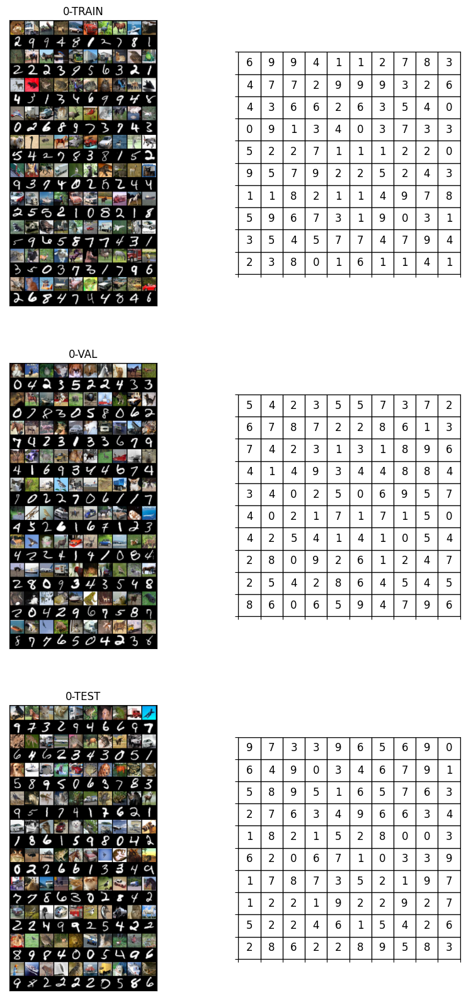

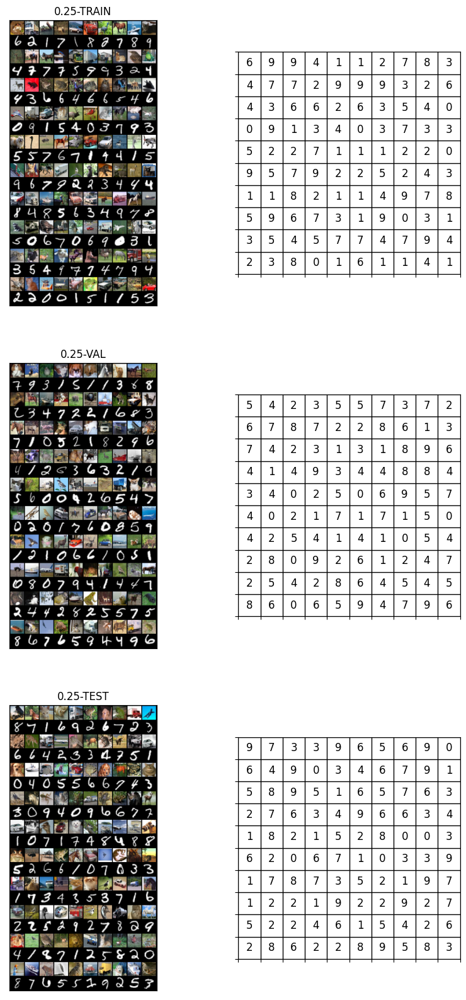

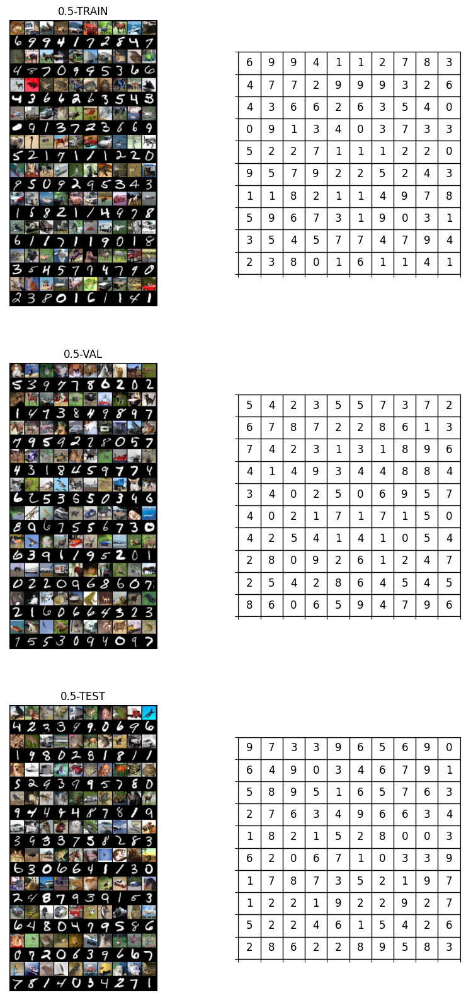

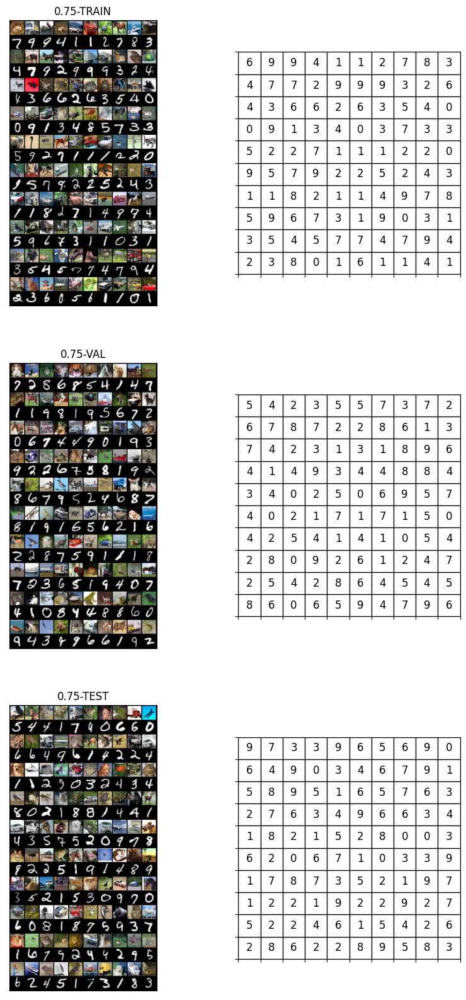

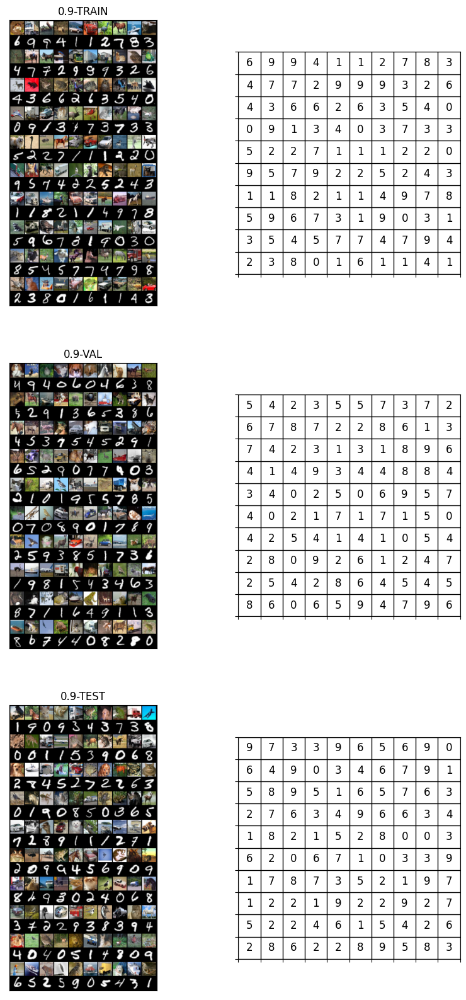

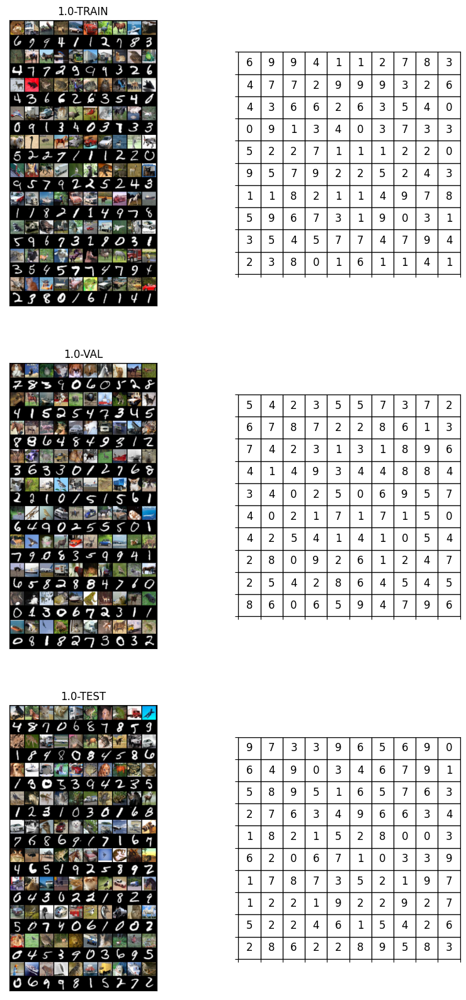

In [42]:

for corr in [0, 0.25, 0.5, 0.75, 0.9, 1.0]:
    root = f"../datasets/MNISTCIFAR/MNIST_CIFAR_{corr}.pth"
    ds = torch.load(root)

    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(10,20))

    for i, split in enumerate(['train','val','test']):

        imgs = []
        labels = []

        for j in range(100):
            imgs.append(ds[split]['data'][j])
            labels.append(ds[split]['targets'][j])
        axs[i, 0].imshow(torchvision.utils.make_grid(imgs,nrow = 10).permute(1,2,0))
        axs[i,0].set_title(f"{corr}-{split.upper()}")
        axs[i,0].set_xticks([])
        axs[i,0].set_yticks([])
        axs[i,0].set_xticklabels([])
        axs[i,0].set_yticklabels([])
        pretty_print_matrix(axs[i, 1],labels,nrows=10)

    print()

## Take 2

We replicate the dataset as instructed in the paper.

In [23]:
# Train data
from torchvision.datasets import MNIST, CIFAR10
# Train data
import torch

root = "../datasets"
mnist_train = MNIST(root, train=True)
cifar_train = CIFAR10(root, train=True)
mnist_test = MNIST(root, train=False)
cifar_test = CIFAR10(root, train=False, download=True)

x_spur = dict()
y_spur = dict()
x_task = dict()
y_task = dict()
x_spur['train']= mnist_train.data
y_spur['train'] = mnist_train.targets
x_task['train'] = cifar_train.data
y_task['train']= cifar_train.targets
x_spur['test'] = mnist_test.data
y_spur['test'] = mnist_test.targets
x_task['test']= cifar_test.data
y_task['test'] = cifar_test.targets
    
seed = 123

for corr in [0.0, 0.25, 0.5, 0.75, 0.9, 1.0]:
    ds = defaultdict(dict)
    print(corr)
    for split in ['train','test']:

        if split == 'test':
            x, y, y_mnist = combine_datasets(x_task[split], y_task[split], x_spur[split], y_spur[split], -corr, n_classes=2)
            val_x, test_x,  val_y, test_y, val_mnist, test_mnist = train_test_split(x, y, y_mnist, test_size=0.5, random_state=seed)
            ds['val'] = {'data': val_x, 'targets': val_y, 'mnist': val_mnist}
            ds['test'] = {'data': test_x, 'targets': test_y, 'mnist': test_mnist}
        else:
            x, y, y_mnist = combine_datasets(x_task[split], y_task[split], x_spur[split], y_spur[split], corr, n_classes=2)
            ds['train'] = {'data': x, 'targets': y, 'mnist': y_mnist}
            
    torch.save(ds, f"{root}/MNISTCIFAR/MNIST_CIFAR_binary_{abs(corr)}.pth")

Files already downloaded and verified
0.0
0.25
0.5
0.75
0.9
1.0


In [25]:
for corr in [0.0, 0.25, 0.5, 0.75, 0.9, 1.0]:
    root = f"../datasets/MNISTCIFAR/MNIST_CIFAR_binary_{corr}.pth"
    ds = torch.load(root)
    p = (1 + corr) / 2
    for split in ['train','val','test']:
        a = ds[split]
        print(p, split, (a['targets'] == a['mnist']).float().mean())

0.5 train tensor(0.5077)
0.5 val tensor(0.4930)
0.5 test tensor(0.5130)
0.625 train tensor(0.6222)
0.625 val tensor(0.3690)
0.625 test tensor(0.3840)
0.75 train tensor(0.7560)
0.75 val tensor(0.2590)
0.75 test tensor(0.2710)
0.875 train tensor(0.8774)
0.875 val tensor(0.1250)
0.875 test tensor(0.1370)
0.95 train tensor(0.9525)
0.95 val tensor(0.0590)
0.95 test tensor(0.0400)
1.0 train tensor(1.)
1.0 val tensor(0.)
1.0 test tensor(0.)


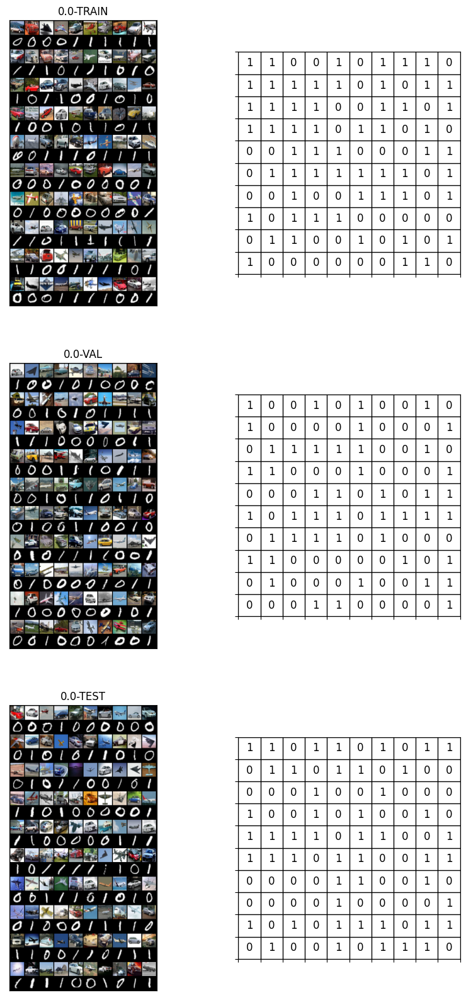

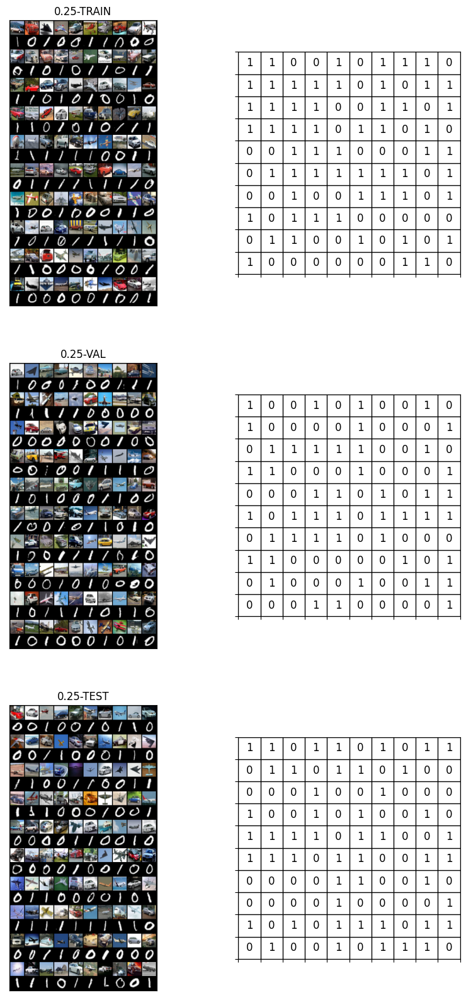

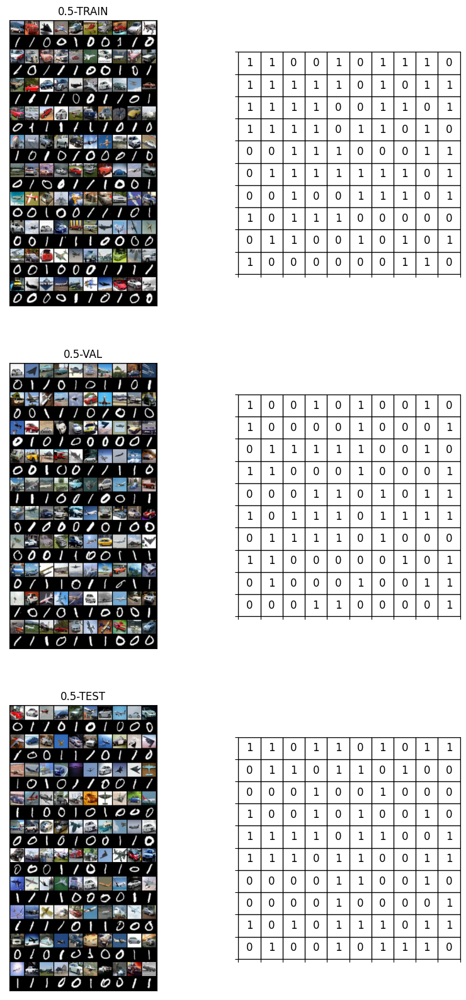

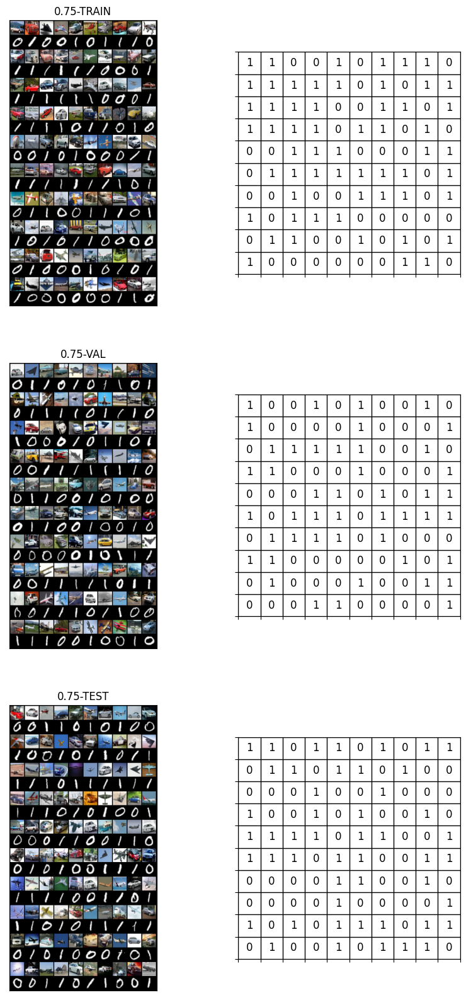

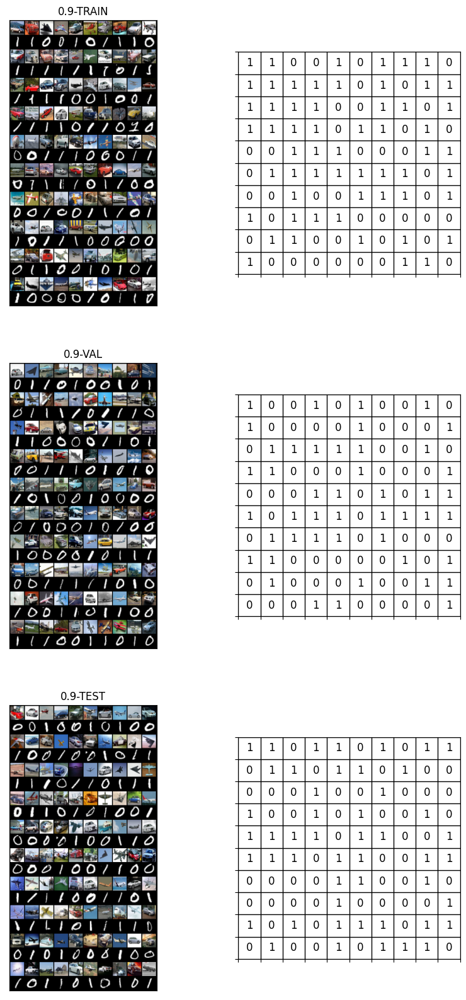

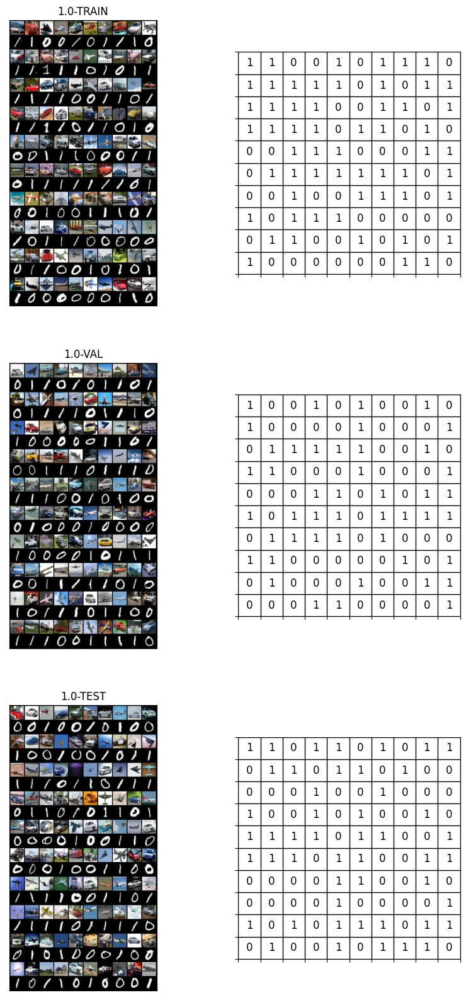

In [26]:
for corr in [0.0, 0.25, 0.5, 0.75, 0.9, 1.0]:
    root = f"../datasets/MNISTCIFAR/MNIST_CIFAR_binary_{corr}.pth"
    ds = torch.load(root)

    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(10,20))

    for i, split in enumerate(['train','val','test']):

        imgs = []
        labels = []

        for j in range(100):
            imgs.append(ds[split]['data'][j])
            labels.append(ds[split]['targets'][j])
        axs[i, 0].imshow(torchvision.utils.make_grid(imgs,nrow = 10).permute(1,2,0))
        axs[i,0].set_title(f"{corr}-{split.upper()}")
        axs[i,0].set_xticks([])
        axs[i,0].set_yticks([])
        axs[i,0].set_xticklabels([])
        axs[i,0].set_yticklabels([])
        pretty_print_matrix(axs[i, 1],labels,nrows=10)

    print()

### Calculate Group Labels

In [31]:
import torch 

group_tensor = []

for dataset in ["_binary", ""]:
    for corr in [0.0, 0.25, 0.5, 0.75, 0.9, 1.0]:
        root = f"../datasets/MNISTCIFAR/MNIST_CIFAR{dataset}_{corr}.pth"
        ds = torch.load(root)

        for split in ['train', 'val', 'test']:
            for t, m in zip(ds[split]['targets'],ds[split]['mnist']):
                g = int(str(t.item())+str(m.item()))
                #if g not in list(groups.keys()):
                #    groups[g] = counter
                #    counter +=1

                group_tensor.append(g)

            ds[split]['group'] = torch.tensor(group_tensor,dtype=torch.uint8)
            torch.save(ds, root)
                    

In [18]:
ds.keys()

dict_keys(['train', 'val', 'test'])

In [33]:
import numpy as np

np.unique(ds['train']['group'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=uint8)

In [28]:
len(groups)

100